In [1]:
import torch
from io import BytesIO
from PIL import Image
import requests

> 打开多模态的世界（数字世界 -> 物理世界），广阔应用的大门。

- basics：det(检测)、rec(识别)、seg(分割，mask 0-1)
- Visual Prompting: 与其用文字（Text Prompt）告诉 AI “找什么”，不如直接用视觉信息（如图片、框、点、涂鸦）作为提示 (Visual clues)，引导（Visual guided）模型完成特定的视觉任务（vqa）
- sam3: 支持 prompt 输入，https://github.com/facebookresearch/sam3/blob/main/examples/sam3_image_predictor_example.ipynb
    - Text prompts: Using natural language descriptions to segment objects (e.g., "person", "face")
        - single simple noun phrase
        - 毕竟不是 vlm 
    - Box prompts: Using bounding boxes as exemplar visual prompts
- MLLM（VLM） can use SAM 3 as a tool："VLM as Brain, SAM as Eyes/Hands" 
    - https://github.com/facebookresearch/sam3/blob/main/examples/sam3_agent.ipynb
    - VLM：负责高层逻辑推理、用户意图理解、策略规划和最终决策。它并不直接画 Mask，而是指挥 SAM 去画。
        - vlm：Qwen/Qwen3-VL-8B-Thinking, gpt4o/gpt4.1, gemini 2.5 flash
        - 图文输入
    - SAM 3 (Segment Anything Model 3)：负责底层的视觉分割任务。它听不懂复杂的推理指令（如“左边第二个没穿鞋的人”），但非常擅长执行简单的名词分割（如“person”）。
- 基于 gemini 的原生多模态的：检测识别分割示例
    - 支持分割的应该只有 gemini 2.5 flash (12/20, 2025)
    - https://developers.googleblog.com/en/conversational-image-segmentation-gemini-2-5/

In [2]:
IMAGE_URL = "http://images.cocodataset.org/val2017/000000039769.jpg"

### sam3

In [3]:
from sam3.model_builder import build_sam3_image_model
from sam3.model.sam3_image_processor import Sam3Processor
from sam3.visualization_utils import draw_box_on_image, plot_results

/home/zhangchunhui/miniconda3/envs/sam3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


- 自动下载模型到 hf home：`.cache/huggingface/hub`
    - 3.3GB, sam3.pt

In [4]:
model = build_sam3_image_model()
model.to('cuda')
processor = Sam3Processor(model)

In [5]:
IMAGE_URL = "http://images.cocodataset.org/val2017/000000039769.jpg"
response = requests.get(IMAGE_URL)
image = Image.open(BytesIO(response.content)).convert("RGB")
inference_state = processor.set_image(image)

found 2 object(s)


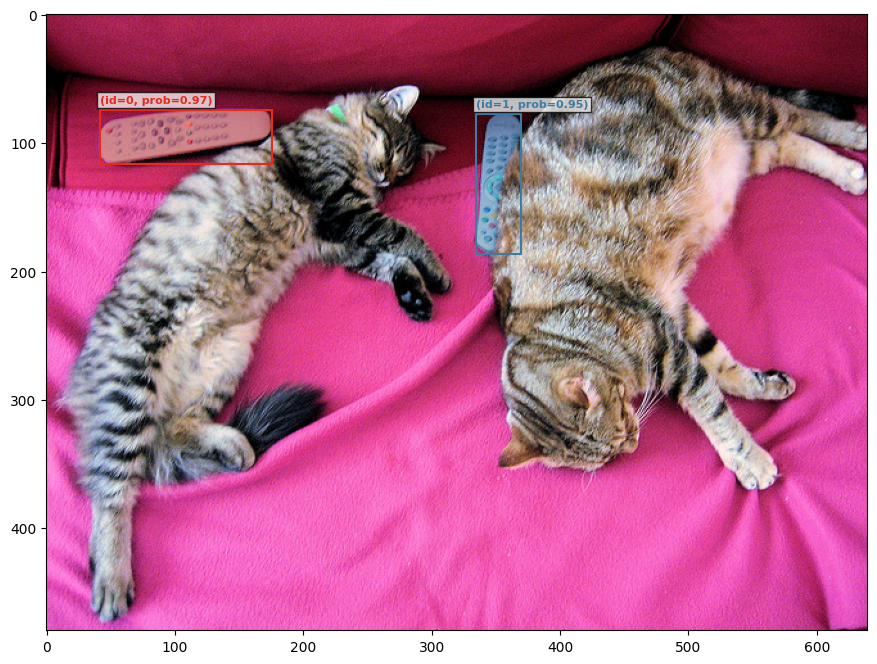

In [7]:
output = processor.set_text_prompt(state=inference_state, prompt="remote")
plot_results(image, output)

found 2 object(s)


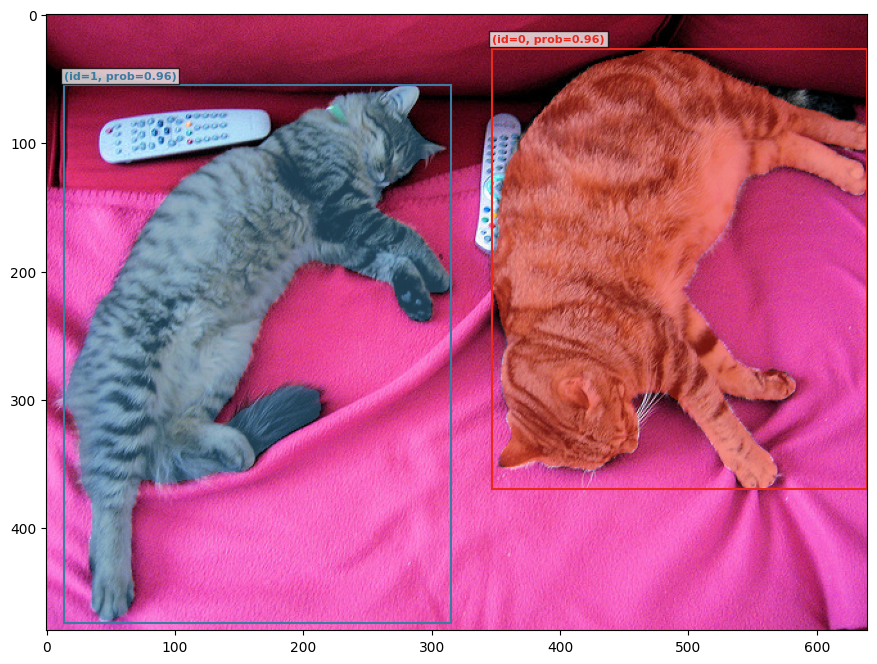

In [8]:
output = processor.set_text_prompt(state=inference_state, prompt="cat")
plot_results(image, output)

Total objects found: 4
found 4 object(s)


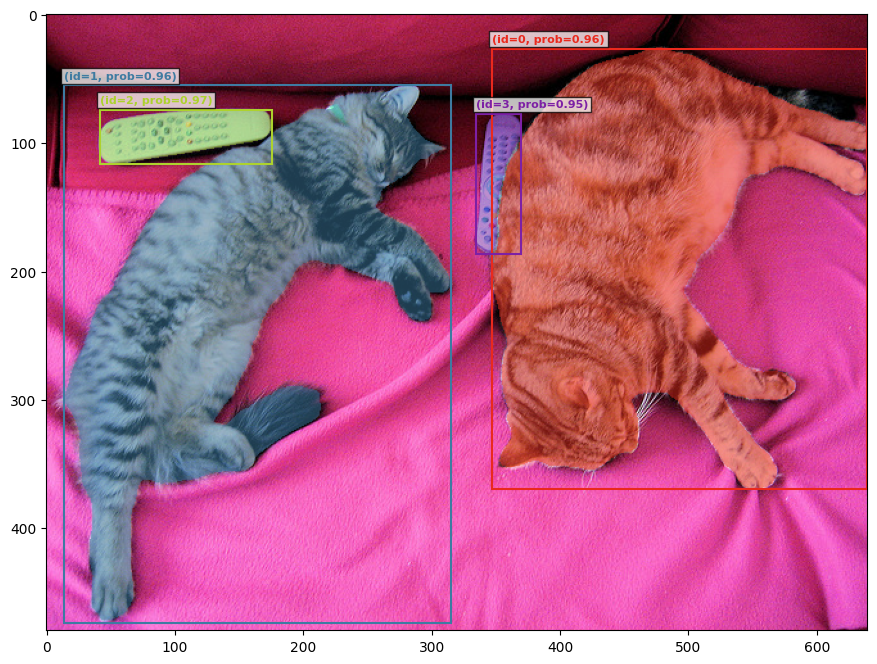

In [10]:
prompts = ["cat", "remote"] 

all_masks = []
all_boxes = []
all_scores = []

for p in prompts:
    # set_text_prompt 会更新 state 中的文本特征和结果，但保留图像特征
    output = processor.set_text_prompt(state=inference_state, prompt=p)
    
    # 获取当前 prompt 的结果
    masks, boxes, scores = output["masks"], output["boxes"], output["scores"]
    
    # 如果检测到了物体，将其加入列表
    if len(scores) > 0:
        all_masks.append(masks)
        all_boxes.append(boxes)
        all_scores.append(scores)

# 4. 合并结果并可视化
if all_masks:
    final_output = {
        "masks": torch.cat(all_masks, dim=0),
        "boxes": torch.cat(all_boxes, dim=0),
        "scores": torch.cat(all_scores, dim=0)
    }
    # 打印结果数量
    print(f"Total objects found: {len(final_output['scores'])}")
    plot_results(image, final_output)
else:
    print("No objects detected.")

In [12]:
image = Image.open('./data/test_image.jpg')
processor = Sam3Processor(model, confidence_threshold=0.5)
inference_state = processor.set_image(image)
processor.reset_all_prompts(inference_state)

found 12 object(s)


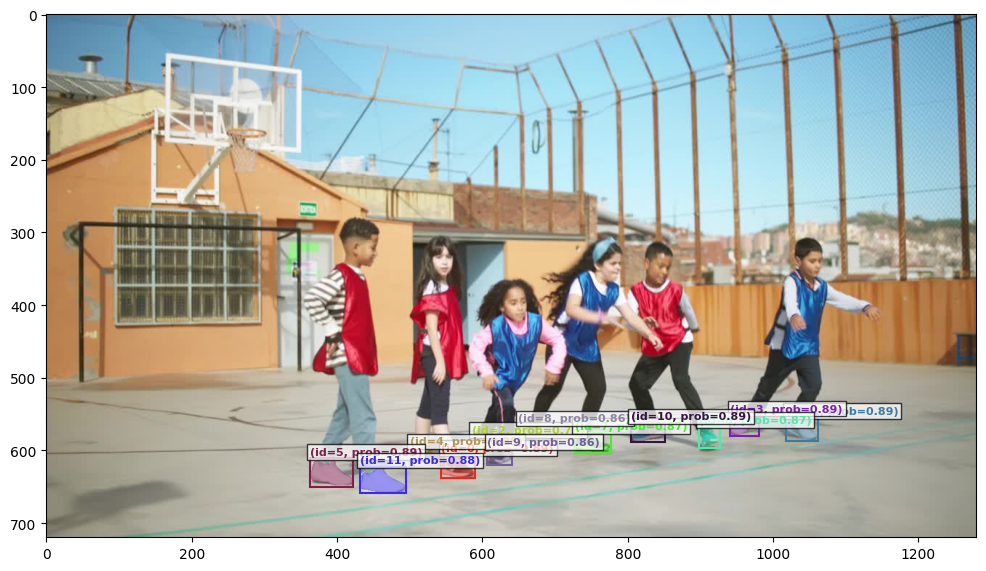

In [14]:
inference_state = processor.set_text_prompt(state=inference_state, prompt="shoe")
plot_results(image, inference_state)

found 6 object(s)


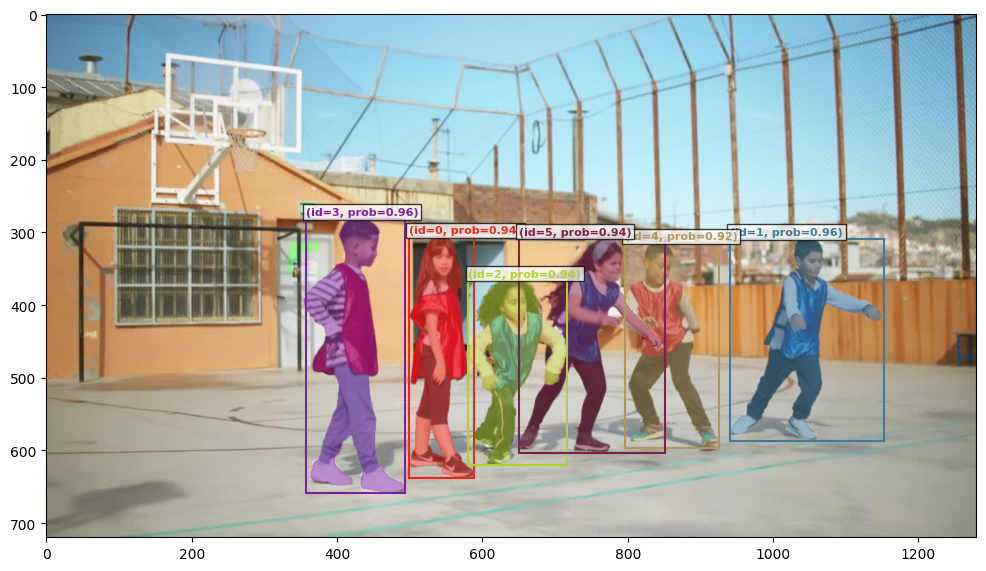

In [15]:
inference_state = processor.set_text_prompt(state=inference_state, prompt="child")
plot_results(image, inference_state)

found 2 object(s)


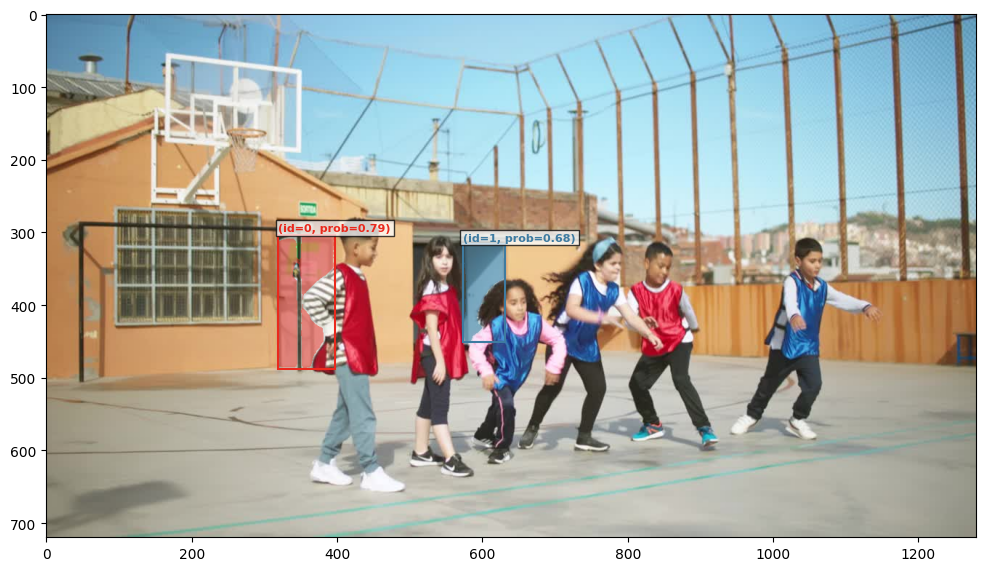

In [16]:
inference_state = processor.set_text_prompt(state=inference_state, prompt="door")
plot_results(image, inference_state)

### SAM3 Agent

- https://github.com/facebookresearch/sam3/blob/main/examples/sam3_agent.ipynb
    - https://github.com/facebookresearch/sam3/blob/main/sam3/agent/system_prompts/system_prompt.txt
        - https://github.com/facebookresearch/sam3/blob/main/sam3/agent/system_prompts/system_prompt.txt#L23
        - System Prompt 明确禁止使用方位词、数量词或复杂修饰语作为 SAM 的输入（例如不能输 "left child"），强制要求使用通用名词（如 "child" 或 "person"）。
- 多模态问答

| 工具名称 | 触发者 | 输入参数 (Parameters) | 执行逻辑 | 输出/反馈 |
| :--- | :--- | :--- | :--- | :--- |
| **segment_phrase** | VLM | `text_prompt`: string (如 "cat") | 调用 SAM 3 模型对全图进行分割 | 一张叠加了彩色编号 Mask 的新图片，以及生成的 Mask 数量信息 |
| **examine_each_mask** | VLM | 无 (Empty JSON) | 启动子循环，对现有 Mask 逐个生成放大图(Zoom-in)，让 VLM 二次确认(Accept/Reject) | 一张经过筛选、只保留 Accept Mask 的新图片，以及保留数量信息 |
| **select_masks_and_return** | VLM | `final_answer_masks`: list[int] (如 `[1, 3]`) | 提取指定 ID 的二进制 Mask，生成最终输出 | **最终结果** (包含 Masks 的 JSON 文件 + 渲染 PNG 图片) |
| **report_no_mask** | VLM | 无 (Empty JSON) | 确认图中无符合描述的目标 | **最终结果** (空的 Mask 列表 JSON) |

- 基于 gpt4o + sam3 tools 的完整交互过程
    - 第一轮 (Scenario 1)：VLM 接收原始图像，制定策略，调用 SAM 生成候选 Mask。
    - 第二轮 (Scenario 2)：VLM 接收带有 Mask 的结果图，进行视觉验证和逻辑推理，选出最终答案。
- 第一轮：策略规划 (Scenario 1)
    - 输入：
        - 原始图片 (test_image.jpg)
        - 用户指令：“The leftmost child wearing blue vest” (最左边穿蓝马甲的孩子)。
    - GPT-4o 的思考 (`<think>`)：
        - 分析 (Analyze)：识别出图像中有一群孩子，穿着红蓝两种颜色的马甲。注意到左侧确实有一个孩子穿着蓝马甲。
        - 思考 (Think)：明确任务是找到“穿蓝马甲”的孩子中“最左边”的那个。
        - 规划 (Plan)：由于 SAM 不擅长处理方位词（"leftmost"），策略是先用 segment_phrase 工具把所有“穿蓝马甲的孩子”都分割出来，然后在下一轮通过视觉判断哪一个在最左边。
        - 决策 (Decide)：选择的 Prompt 是 "child in blue vest"。这是一个很好的通用名词短语，避开了具体的方位描述。
    - 工具调用
    ```
    {
      "name": "segment_phrase",
      "parameters": {
        "text_prompt": "child in blue vest"
      }
    }
    ```
- 第二轮：视觉验证与决策 (Scenario 2)
    - 输入：
        - 系统反馈：“segment_phrase 工具生成了 3 个 Mask”。
        - 结果图片 (child in blue vest.png)：原图上叠加了 3 个带编号的 Mask。
    - GPT-4o 的思考 (`<think>`)：
        - 分析 (Analyze)：
            - 模型观察了 Mask 1, Mask 2, Mask 3 的位置。
            - 注意：这里模型出现了一处明显的口误/幻觉 (Text Hallucination)。
            - 模型在文本中写道："Mask 1 covers the child on the far right... and is indeed the leftmost..."（Mask 1 覆盖了最右边的孩子... 确实是最左边的...）。这在逻辑上是矛盾的。通常这种情况意味着模型在视觉定位上是对的（它看到了目标是 Mask 1），但在生成解释性文本时搞混了 "left" 和 "right" 的单词，或者它认为图像是镜像的。
        - 思考 (Think)：确认 Mask 1 覆盖了目标对象（"leftmost child wearing a blue vest"）。
        - 规划 (Plan)：不需要再调用 segment_phrase 或 examine_each_mask，因为目标已经清晰可见。决定直接返回 Mask 1。

found 3 object(s)


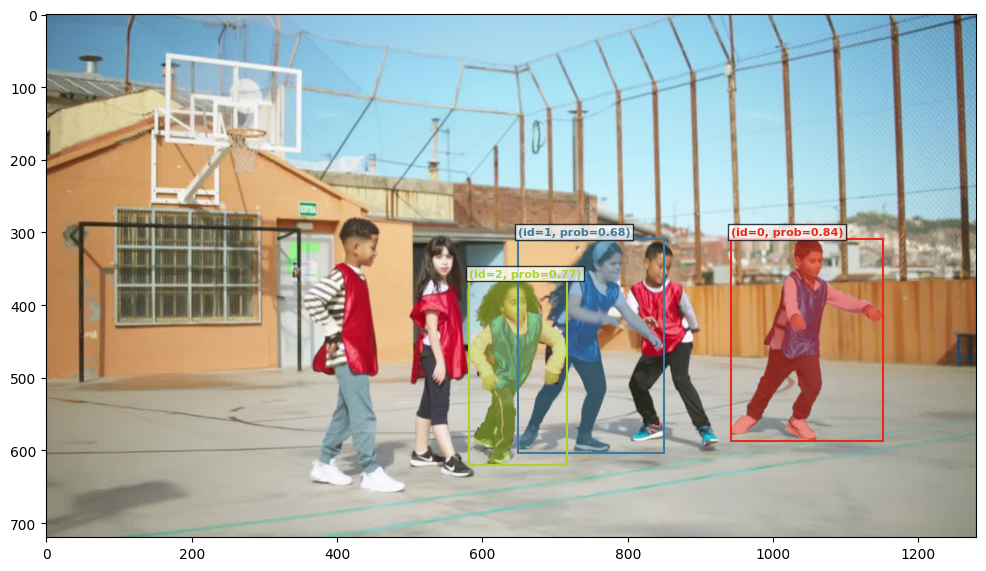

In [42]:
inference_state = processor.set_text_prompt(state=inference_state, prompt="child in blue vest")
plot_results(image, inference_state)

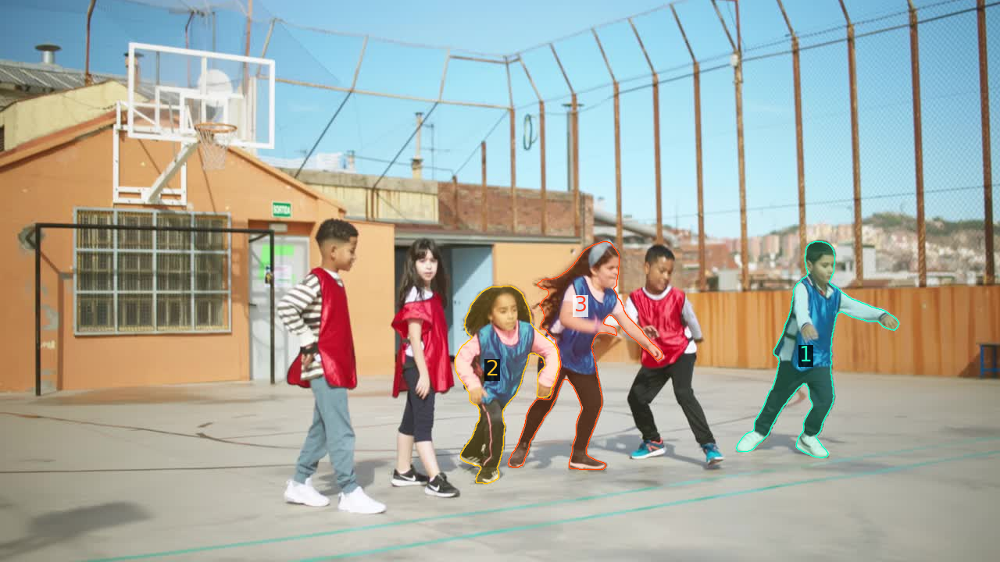

In [45]:
from IPython.display import display, Image
display(Image(filename='./data/child in blue vest.png'))

### Gemini 

- https://colab.research.google.com/drive/1eDvf_Ky9jLOZFShgHrm4GI-wkAaQnue6?usp=sharing
- 具备分割能力的不是 Gemini 3（暂时），是 Gemini 2.5 flash。目前应该还没把 segmentation 能力训练进 Gemini 3 里；
- 检测是 box-2d（是矩形框）；分割是 0/1 矩阵（binary mask），是轮廓，未必是严格的多边形；
- 目前 Gemini 2.5 flash 的分割出来的，很难直接说是 tokens，结果上已经是 base64 编码的图片了；即是是对 token by token 的 autoregressive Generation，这里的 token 也应该是 Visual tokens，非 Language token；
    - I think the Gemini 2.5 models return a much more efficient token representation of the image masks, then the Gemini API layer converts those into base4-encoded PNG image strings.
- 未来的趋势还是我觉得还是端到端，检测/分割/识别都做进原生多模态模型里。

In [19]:
# !pip install google-genai

In [53]:
from google import genai
from google.genai import types
from PIL import Image, ImageDraw
import io
import base64
import json
import numpy as np
import os
from dotenv import load_dotenv, find_dotenv
from seg_utils import parse_json, parse_segmentation_masks, plot_segmentation_masks

In [22]:
assert load_dotenv(find_dotenv(), override=True)

In [23]:
client = genai.Client()

In [54]:
img = Image.open('./data/test_image.jpg')
img.thumbnail([1024, 1024], Image.Resampling.LANCZOS)

In [25]:
prompt = """
Give the segmentation masks for the objects. 
Output a JSON list of segmentation masks where each entry contains the 2D bounding box in the key "box_2d", the segmentation mask in key "mask", and the text label in the key "label". 
Use descriptive labels.
"""

```json
[
  {"box_2d": [75, 114, 375, 276], "mask": "", "label": "basketball hoop"},
  {"box_2d": [428, 737, 816, 908], "mask": "", "label": "boy in blue and white sportswear"},
  {"box_2d": [506, 381, 792, 659], "mask": "", "label": "girl in blue and pink sportswear"},
  {"box_2d": [140, 0, 706, 362], "mask": "", "label": "building"},
  {"box_2d": [426, 390, 882, 461], "mask": "", "label": "girl in red and white sportswear"},
  {"box_2d": [436, 622, 832, 725], "mask": "", "label": "boy in red and white sportswear"},
  {"box_2d": [430, 508, 836, 661], "mask": "", "label": "girl in blue and black sportswear"},
  {"box_2d": [428, 209, 882, 386], "mask": "", "label": "boy in red and grey sportswear"},
  {"box_2d": [587, 834, 824, 1000], "mask": "", "label": "boy in red and white sportswear"},
  {"box_2d": [890, 209, 1000, 715], "mask": "", "label": "basketball court"},
  {"box_2d": [890, 209, 1000, 715], "mask": "<start_of_mask><seg_107><seg_115><seg_12><seg_107><seg_60><seg_60><seg_51> r
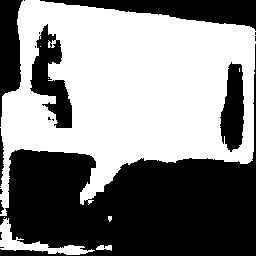
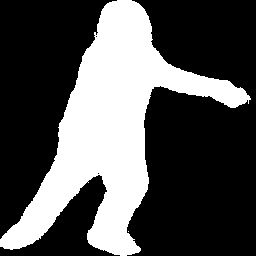
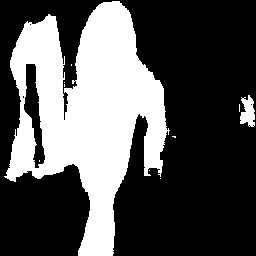
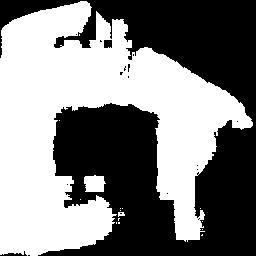
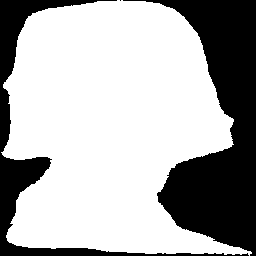
...
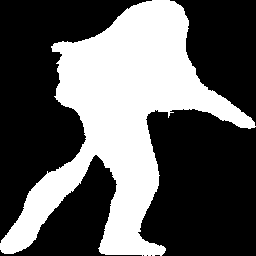
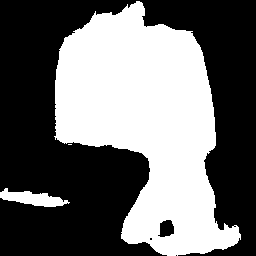
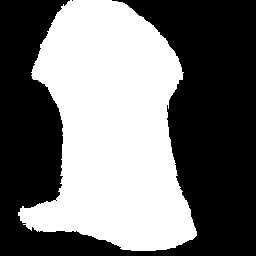
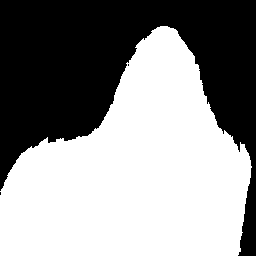
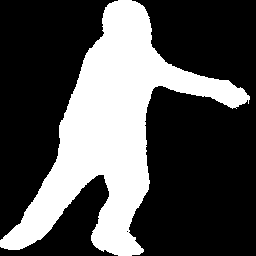

In [33]:
config = types.GenerateContentConfig(
    thinking_config=types.ThinkingConfig(thinking_budget=0) # set thinking_budget to 0 for better results in object detection
)

response = client.models.generate_content(
    model="gemini-2.5-flash",
    contents=[prompt, img], # Pillow images can be directly passed as inputs (which will be converted by the SDK)
    config=config
)
print(response.text)

Object: boy in blue and white sportswear
Mask Image Mode: L
Mask Original Size: (256, 256)
--------------------


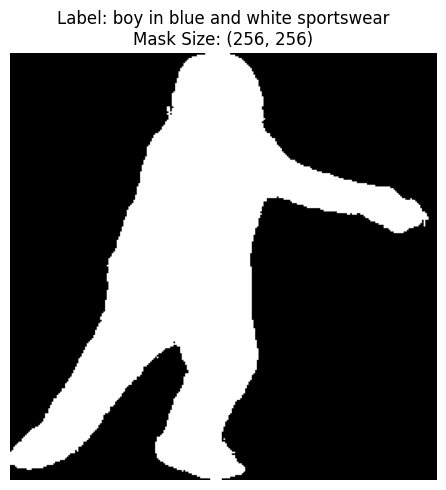

In [2]:
import base64
import io
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

# 假设这是你从 Gemini 得到的响应文本（片段）
response_text = """
[
  {"box_2d": [428, 737, 816, 908], "mask": "data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAQAAAAEACAAAAAB5Gfe6AAADE0lEQVR42u3dQXIbMQxEUd7/0j/JMik7tmRiSOA39tKwn4AROeUoa50o/q5lKj4ud3oLAV+UPf90AXALgFwAuQC4BUAuYAcAuUAA7AJ2AJALYBewAxCAALgFAiAHALcAAQiAWyAAAQhAALwAf4KoG+B3EgIgF9DfA9IBAQiAWCD59V8CbgHkAATALYAcANQC7Ch7/gBgz9+XwA4AcgE7ALgFQC6AXSAAdgHsAsgFQC6AXIC60gOgB+hAQHXpAW5HwC7AU2XPf6sBj5ce4DICzpQe4B4DzpYe4LgBt5Qe4JACl5Ye4DEC7ALYBZALgFygZtmNBMo+sZ1vSZ8GKHv3HgCVb99sAGpGodkA7L5O3/ybLtUaYMslr98CVF91QAP89OoTOuDfNSxe+b2CQR3w3mqmNcBRgfsObs8C3Hhy/fKQOXkCvrEsBcB/FrYkAJ+tbfNzgasfXg09B7y9voaPgrYusMez0LI1dnkYvJpV8gdADUAAMgEBCEBuAQGwAiAHIA2QBjADEIAABMAMQDogLRCAAJgBCEAAAhCAfAsEIAABCEC+BQIQgAAEIAA2AAIQgAAEIAAB0AIgByAAbgACkBFwCyAHIABuAALgFiAAAVADEAA3AHIAcAu8E2cSAMg74L04cwDe/jStAO++cFx+KcCaBvCTED6ANQ/gxd3POICfJZAB7H95L4CS13fPLwKoe4cW+SsJA9B5ANahn32/pwFaA/DkBExtAEP+8iEy3AAaA9R3Uef8a/4AyAHW2Pxrz8LbAiDPrwd4Nj/JP3IHkAHo2gBkAPYsW97/u3ZSAUj+CwEePEs0PQJtlWwKkAkYuwVY8jvA45QBaDkBKxOQBlDnX+6vwJYAew/v7fLvfnbTDeBAfibnX8nfCuBIftrl55hns/zfBkA9AIyN3+wPgzkJwMj8rQBK1tnpnwgdB6BD/lUJwLjPv9NPBlStblIHrHKAuztgyQGqdxenBeqW1R/gsS3mUYHSFfVtgsfPGXcJnDlr3bAnPnzcbPXfTr9qsOQApVuOKQRLUerwnxEsY92S/Rcz6Rpn3sgIjAAAAABJRU5ErkJggg==", "label": "boy in blue and white sportswear"}
]
"""

def render_gemini_masks(json_response, image_width=1000, image_height=1000):
    """
    解析 Gemini 的响应并显示掩膜。
    注意：为了演示，这里假设原图是 1000x1000（因为 box_2d 是归一化的）。
    实际使用时，你需要传入原图的真实宽高。
    """
    data = json.loads(json_response)
    
    fig, ax = plt.subplots(1, len(data), figsize=(10, 5))
    if len(data) == 1: ax = [ax] # 处理只有一个对象的情况

    for i, item in enumerate(data):
        label = item["label"]
        box_2d = item["box_2d"] # [ymin, xmin, ymax, xmax] 归一化坐标 0-1000
        mask_str = item["mask"]

        # 1. 解码 Base64 字符串
        # 移除前缀 "data:image/png;base64," 
        if "base64," in mask_str:
            mask_b64 = mask_str.split("base64,")[1]
        else:
            mask_b64 = mask_str
            
        mask_bytes = base64.b64decode(mask_b64)
        
        # 2. 转换为 PIL Image 对象
        mask_image = Image.open(io.BytesIO(mask_bytes))
        
        # 3. 计算实际坐标 (这里假设原图是 1000x1000，如果是实图需换算)
        # Gemini 的 box_2d 顺序通常是 [ymin, xmin, ymax, xmax]
        ymin, xmin, ymax, xmax = box_2d
        
        # 计算宽高
        box_width = xmax - xmin
        box_height = ymax - ymin
        
        # 4. 显示
        # 显示 Mask 图片本身
        ax[i].imshow(mask_image, cmap='gray')
        ax[i].set_title(f"Label: {label}\nMask Size: {mask_image.size}")
        ax[i].axis('off')
        
        print(f"Object: {label}")
        print(f"Mask Image Mode: {mask_image.mode}")
        print(f"Mask Original Size: {mask_image.size}")
        print("-" * 20)

    plt.tight_layout()
    plt.show()

# 运行渲染
render_gemini_masks(response_text)

In [28]:
from seg_utils import parse_json, parse_segmentation_masks, plot_segmentation_masks

In [34]:
# Parse masks
masks = parse_segmentation_masks(response.text, img_height=img.size[1], img_width=img.size[0])

Invalid mask
Invalid mask


In [35]:
result_img = plot_segmentation_masks(img.copy(), masks)

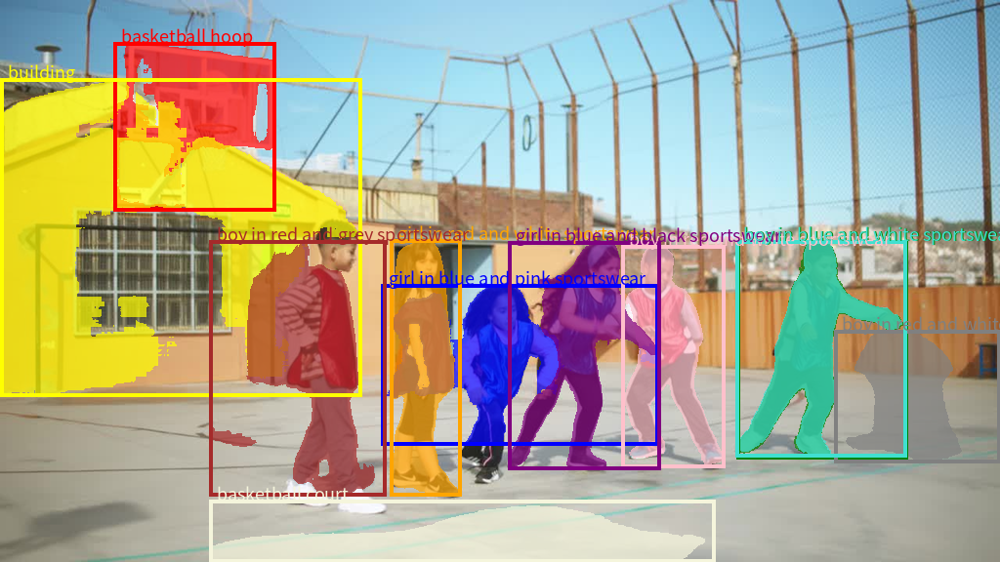

In [37]:
result_img

In [41]:
config = types.GenerateContentConfig(
    thinking_config=types.ThinkingConfig(thinking_budget=0) # set thinking_budget to 0 for better results in object detection
)

response = client.models.generate_content(
    model="gemini-3-flash-preview",
    contents=[prompt, img], # Pillow images can be directly passed as inputs (which will be converted by the SDK)
    config=config
)
print(response.text)

I did not find any bounding box detections for .
```json
[
  {"box_2d": [435, 622, 824, 725], "label": "a boy in red and black clothes", "mask": [435, 622, 824, 725]},
  {"box_2d": [391, 276, 915, 387], "label": "a boy in a striped shirt and red vest", "mask": [391, 276, 915, 387]},
  {"box_2d": [507, 452, 863, 560], "label": "a girl in a blue and pink tracksuit", "mask": [507, 452, 863, 560]},
  {"box_2d": [426, 513, 834, 663], "label": "a girl in a blue shirt and black pants", "mask": [426, 513, 834, 663]},
  {"box_2d": [424, 389, 885, 461], "label": "a girl in a red and black outfit", "mask": [424, 389, 885, 461]},
  {"box_2d": [429, 736, 815, 896], "label": "a boy in blue and black athletic wear", "mask": [429, 736, 815, 896]}
]
```


In [49]:
def denormalize(ymin, xmin, ymax, xmax, image_shape):
    # image_shape is (height, width)
    height, width = image_shape
    
    # y coordinates are scaled by height
    y1 = ymin / 1000 * height
    # x coordinates are scaled by width
    x1 = xmin / 1000 * width
    y2 = ymax / 1000 * height
    x2 = xmax / 1000 * width
    
    # Return in [x1, y1, x2, y2] format for PIL.ImageDraw.rectangle
    return x1, y1, x2, y2

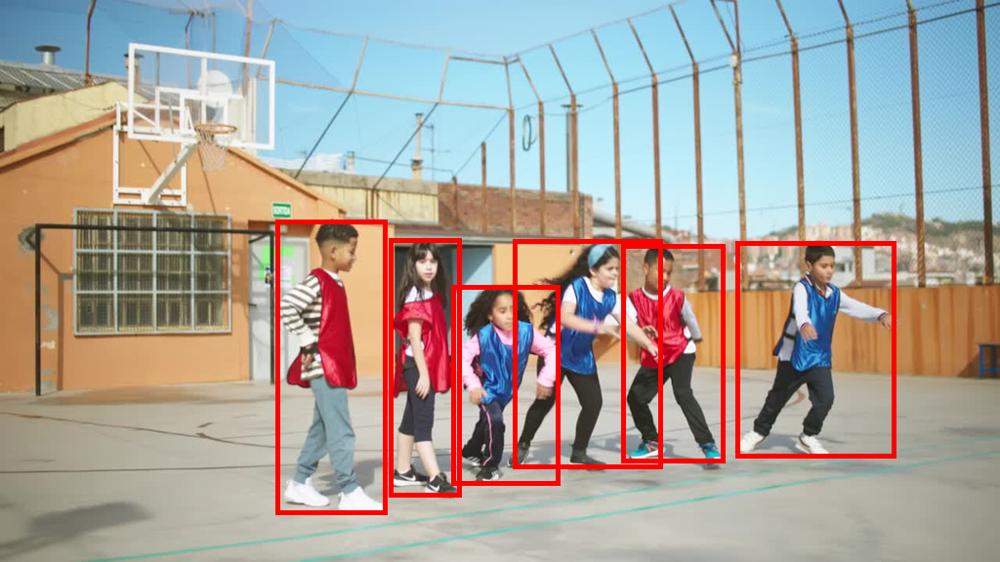

In [57]:
from PIL import ImageDraw
draw = ImageDraw.Draw(img)
width, height = img.size
x1, y1, x2, y2 = denormalize(435, 622, 824, 725, (height, width))
draw.rectangle([x1, y1, x2, y2], outline='red', width=5)
x1, y1, x2, y2 = denormalize(391, 276, 915, 387, (height, width))
draw.rectangle([x1, y1, x2, y2], outline='red', width=5)
x1, y1, x2, y2 = denormalize(507, 452, 863, 560, (height, width))
draw.rectangle([x1, y1, x2, y2], outline='red', width=5)
x1, y1, x2, y2 = denormalize(426, 513, 834, 663, (height, width))
draw.rectangle([x1, y1, x2, y2], outline='red', width=5)
x1, y1, x2, y2 = denormalize(424, 389, 885, 461, (height, width))
draw.rectangle([x1, y1, x2, y2], outline='red', width=5)
x1, y1, x2, y2 = denormalize(429, 736, 815, 896, (height, width))
draw.rectangle([x1, y1, x2, y2], outline='red', width=5)
img

In [48]:
# config = types.GenerateContentConfig(
#     thinking_config=types.ThinkingConfig(thinking_budget=0) # set thinking_budget to 0 for better results in object detection
# )

response = client.models.generate_content(
    model="gemini-3-pro-preview",
    contents=[prompt, img], # Pillow images can be directly passed as inputs (which will be converted by the SDK)
    # config=config
)
print(response.text)

```json
[
  {
    "box_2d": [
      425,
      735,
      812,
      899
    ],
    "mask": [
      [425, 818],
      [435, 830],
      [490, 850],
      [540, 890],
      [560, 899],
      [575, 885],
      [600, 840],
      [700, 830],
      [750, 825],
      [812, 827],
      [800, 795],
      [740, 790],
      [720, 780],
      [770, 750],
      [800, 735],
      [760, 745],
      [680, 780],
      [620, 774],
      [580, 780],
      [530, 790],
      [480, 800],
      [425, 818]
    ],
    "label": "boy running in blue bib"
  },
  {
    "box_2d": [
      507,
      455,
      860,
      560
    ],
    "mask": [
      [507, 495],
      [520, 515],
      [580, 520],
      [630, 540],
      [650, 550],
      [680, 555],
      [650, 530],
      [700, 525],
      [780, 520],
      [840, 540],
      [860, 530],
      [850, 500],
      [800, 490],
      [750, 490],
      [780, 480],
      [830, 485],
      [860, 470],
      [850, 460],
      [750, 470],
      [700, 465],
      [650, 460]